In [1]:
import sys
sys.path.append('/Users/jinchen/Desktop/DSE/IntroML/Project/project-product-price-prediction')

In [22]:
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
matplotlib.rcParams['figure.figsize'] = (15, 15)
plt.rcParams['figure.constrained_layout.use'] = True

from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from sklearn.cluster import MiniBatchKMeans,DBSCAN
from final.feature_extraction.vectorization import text_vectorizaion
from final.dimension_reduction.feature_reduction import dimension_reduction

# Load the Sample Data
- Sample data is already clean

In [3]:
df = pd.read_csv("../../data/random_samples/stratified_sampling_clean_text_data_by_price_whigh_sz50000_1619835594.csv")
df.shape

(50000, 34)

In [4]:
df.head(3)

,train_id,clean_item_description,item_description_bef_word_count,item_description_bef_char_count,item_description_bef_avg_word_len,item_description_upper_word_count,item_description_upper_char_count,item_description_stopword_count,item_description_punctuation_count,item_description_number_count,...,item_name_after_avg_word_len,item_condition_id,category_name,brand_name,shipping,price,c1,c2,c3,price_bin
0,806824,new tags,3.0,13.0,4.333333,0.0,1.0,1.0,0.0,0.0,...,5.250000,1,Women/Athletic Apparel/Shirts & Tops,Nike,1,15.0,women,athletic apparel,shirts & tops,"(10, 15]"
1,772820,nastasya every hills lipstick fashion,6.0,42.0,7.000000,0.0,4.0,1.0,0.0,0.0,...,10.000000,1,Beauty/Makeup/Lips,Anastasia Beverly Hills,0,22.0,beauty,makeup,lips,"(20, 25]"
2,1423115,brand new tags taken bag pictures,11.0,54.0,4.909091,0.0,1.0,5.0,0.0,0.0,...,6.166667,1,Women/Jeans/Leggings,LuLaRoe,0,54.0,women,jeans,leggings,"(50, 60]"


In [5]:
df.clean_item_description[12]

'corners bottom great shape lips smells markings inside cleanthere small water mark indicated third photo comes dusting'

# Text Feature Extraction

In [24]:
# if tfidf = True using TfidfVectorizer, else using CountVectorizer
# max_features: max number of feature generated for the input text string
description_feature,  description_feature_name = text_vectorizaion(df, text_col = "clean_item_description", 
                                                                   tfidf = True, min_df=10, max_features=100000)

In [10]:
vz = vectorizer.fit_transform(df['clean_item_description'])

In [25]:
print(description_feature.shape)

(50000, 14230)


# Dimension Reduction

In [12]:
num_clusters = 20
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, verbose=0, max_iter=1000)
kmeans = kmeans_model.fit(description_feature)
kmeans_clusters = kmeans.predict(description_feature)
kmeans_distances = kmeans.transform(description_feature)
print(kmeans_distances.shape)

(50000, 20)


In [13]:
kmeans_distances[0,:5]

array([0.99880623, 1.03498139, 0.99541204, 1.02062114, 1.01111529])

In [14]:
sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = np.array(vectorizer.get_feature_names())

for i in range(num_clusters):
    print("Cluster %d: \t %s" % (i, " | ".join(terms[sorted_centroids[i, :5]])))
    

Cluster 0: 	 size | pink | secret | small | victories secret
Cluster 1: 	 excellent | excellent condition | condition | used | size
Cluster 2: 	 free | shipping | price | free shipping | firm
Cluster 3: 	 box | original | original box | comes | comes original
Cluster 4: 	 bag | dust | dust bag | leather | authentic
Cluster 5: 	 large | size large | size | shirt | new
Cluster 6: 	 worn | times | size | worn times | worn twice
Cluster 7: 	 never | never worn | new never | worn | never used
Cluster 8: 	 description yet | yet | description | bundles | large size
Cluster 9: 	 sealed | new sealed | new | brand new | brand
Cluster 10: 	 know | let know | let | know questions | questions
Cluster 11: 	 sterling | silver | sterling silver | blue | tiffany
Cluster 12: 	 phone | is | gold | unlocked | screen
Cluster 13: 	 am | details am | details | bundle | new
Cluster 14: 	 great condition | great | condition | size | worn
Cluster 15: 	 good | good condition | condition | size | used
Cluster 16:

#  Visualization

In [15]:
bins = [0,25, 50,75,100, 2500] # 17  bins
df['price_bin'] = pd.cut(df['price'], bins)

In [16]:
# reduce dimension to 2 using tsne
tsne_model = TSNE(n_components=2, verbose=1, random_state=2904, n_iter=500)
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.081s...
[t-SNE] Computed neighbors for 50000 samples in 44.280s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sa

In [17]:
#combined_sample.reset_index(drop=True, inplace=True)
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters
kmeans_df['price_bin'] = df['price_bin']
kmeans_df['category'] = df['c1']

Text(0.5, 1.0, 'kMean Clusters (k=20) - Price Bins')

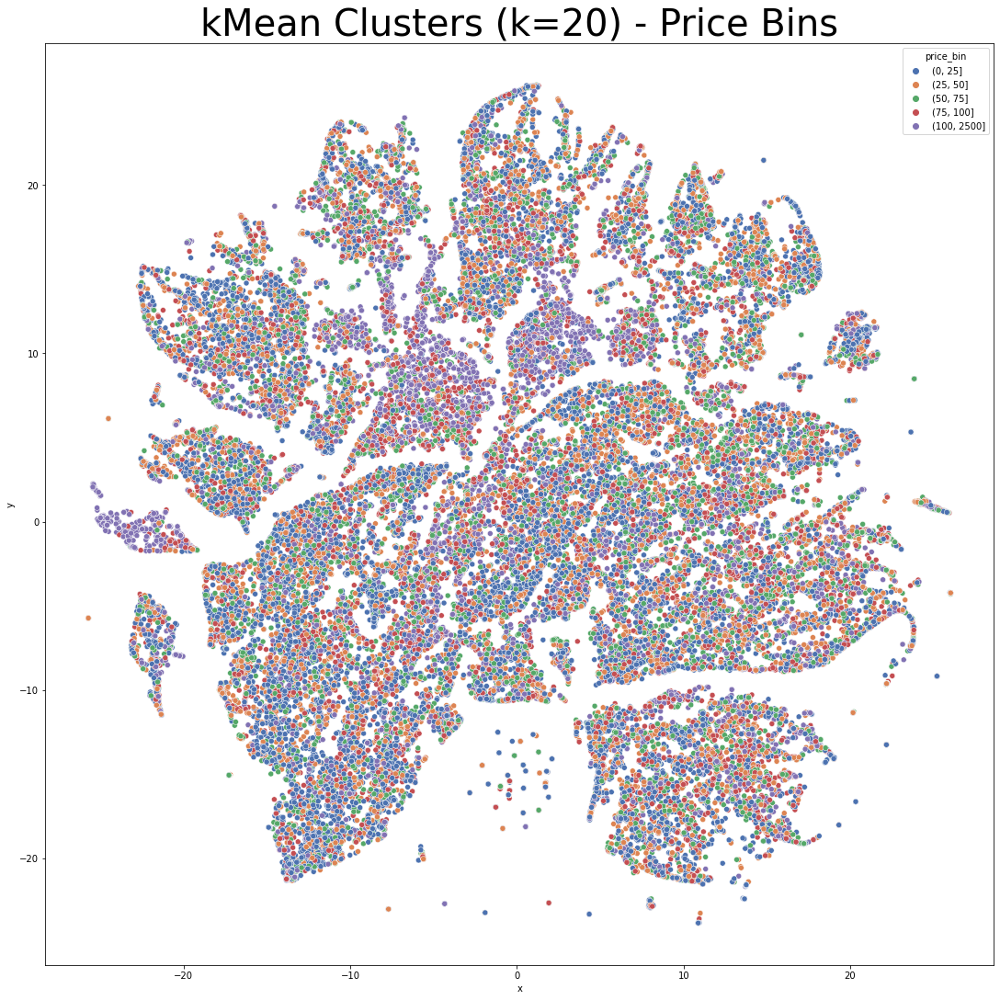

In [18]:
sns.scatterplot(data=kmeans_df, x='x', y='y', hue='price_bin', palette="deep")
plt.title("kMean Clusters (k=20) - Price Bins",fontdict = {'fontsize' : 40})

Text(0.5, 1.0, 'kMean Clusters (k=20) - Item Category')

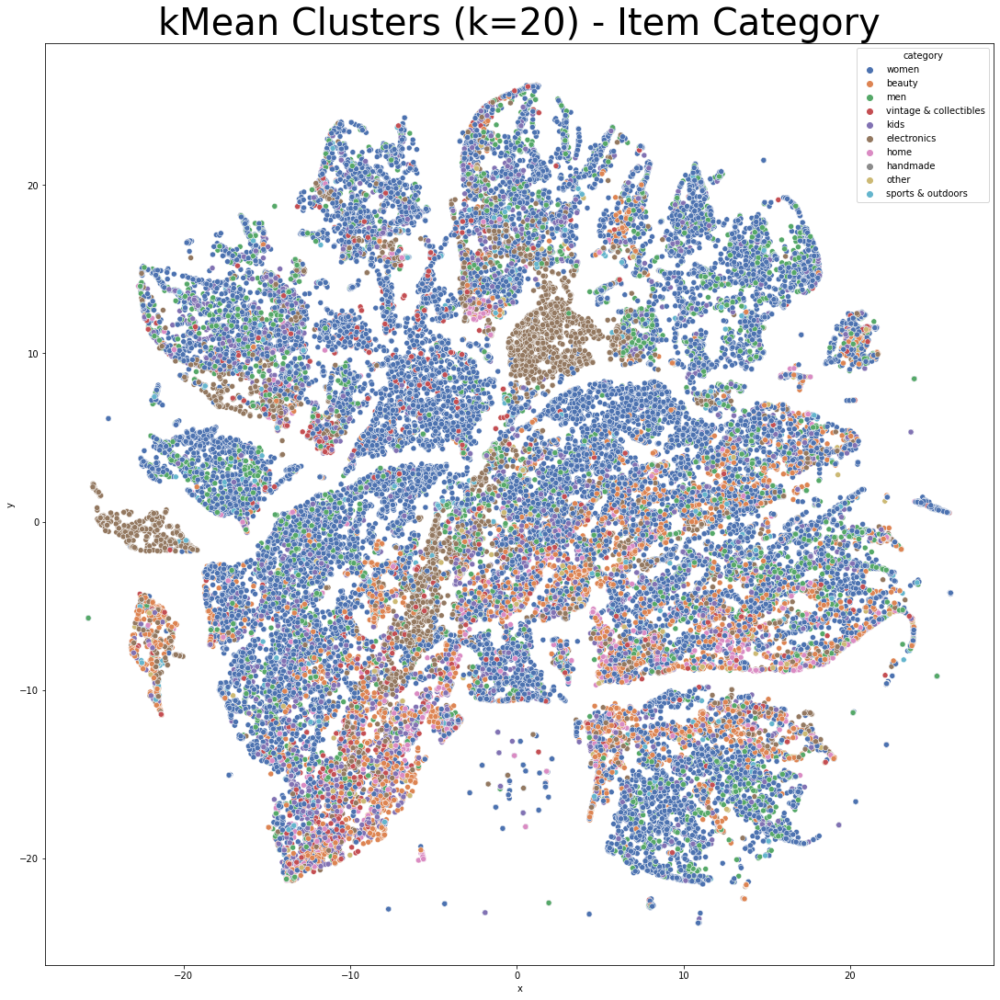

In [19]:
sns.scatterplot(data=kmeans_df, x='x', y='y', hue='category', palette="deep")
plt.title("kMean Clusters (k=20) - Item Category",fontdict = {'fontsize' : 40})

Text(0.5, 1.0, 'kMean Clusters (k=20) - Cluster')

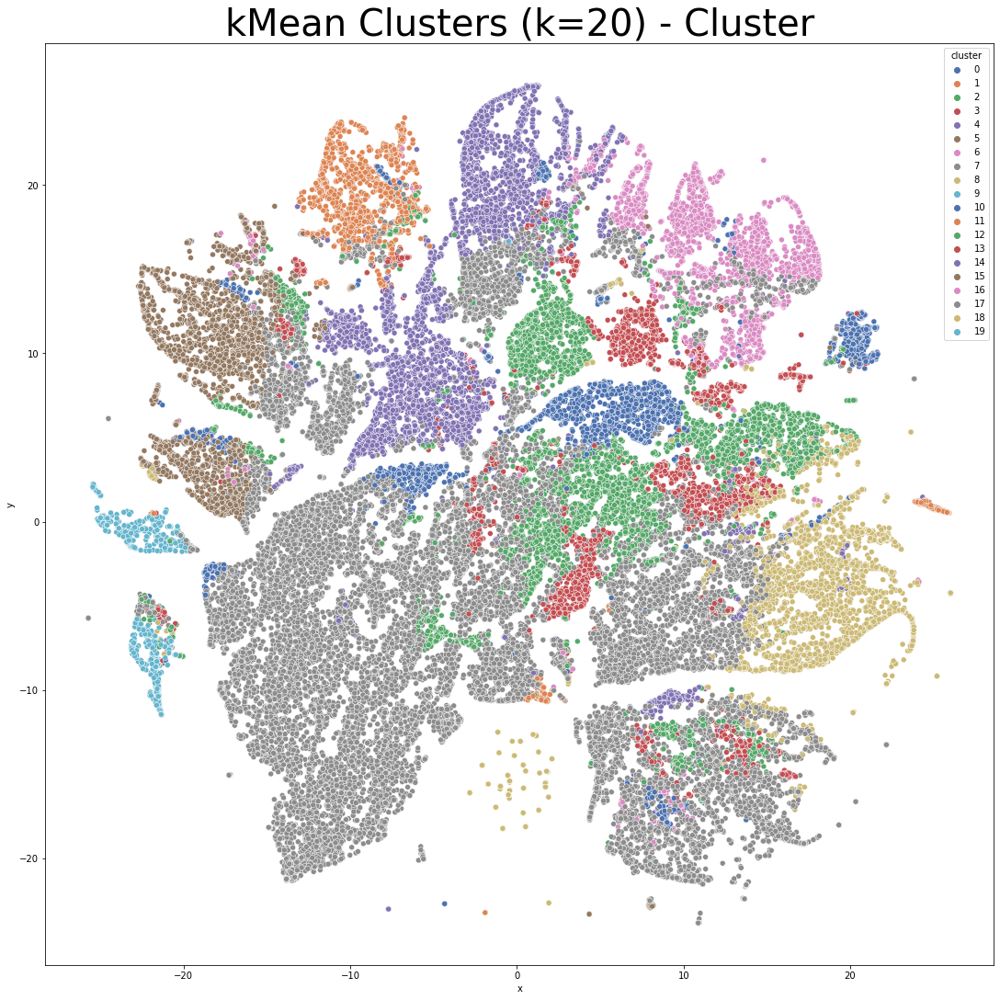

In [20]:
sns.scatterplot(data=kmeans_df, x='x', y='y', hue='cluster', palette="deep")
plt.title("kMean Clusters (k=20) - Cluster",fontdict = {'fontsize' : 40})

## SVD

In [27]:
data = dimension_reduction(description_feature.toarray(), method = 'SVD', n_comp = 50)
tsne_model = TSNE(n_components=2, verbose=1, random_state=2904, n_iter=500)
data.shape

(50000, 50)

In [28]:
tsne_kmeans = tsne_model.fit_transform(data)
svd_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
svd_df['category'] = df['c1']
svd_df['price_bin'] = df['price_bin']

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.206s...
[t-SNE] Computed neighbors for 50000 samples in 248.463s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for s

Text(0.5, 1.0, 'SVD- Price Bin')

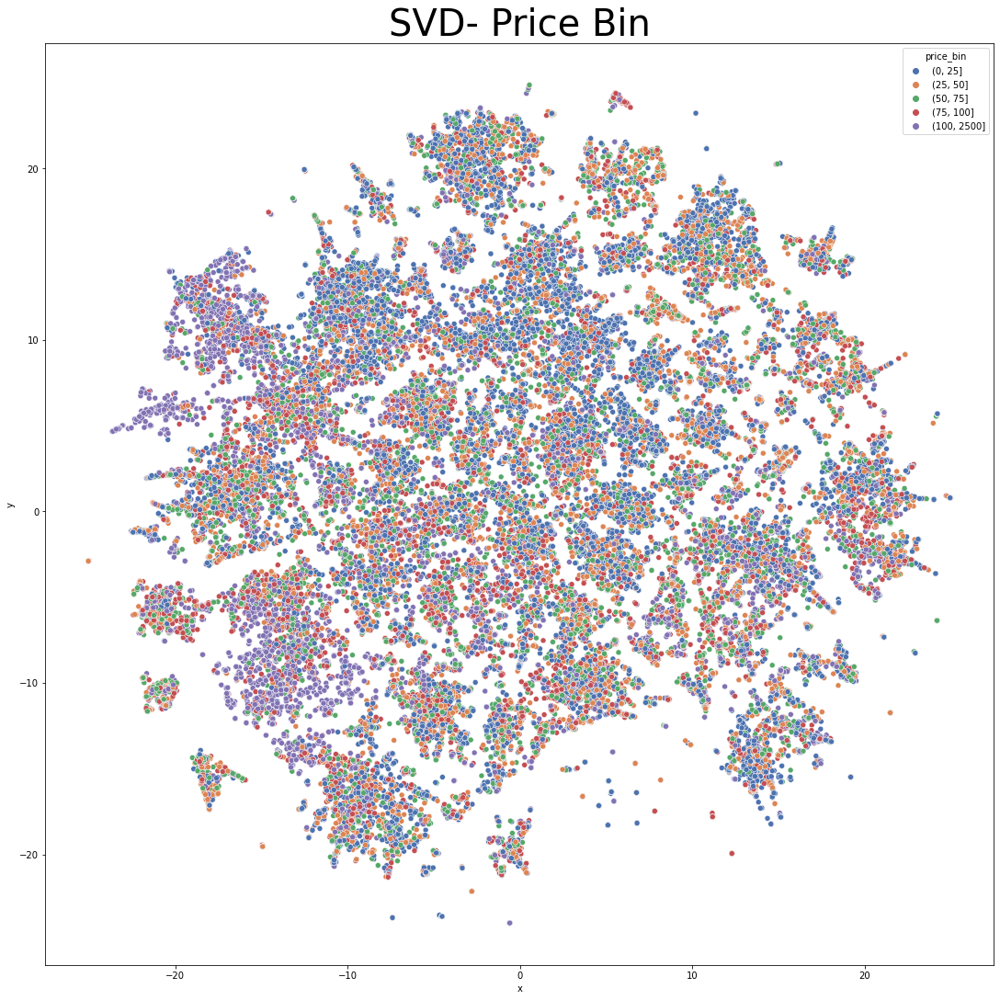

In [30]:
sns.scatterplot(data=svd_df, x='x', y='y', hue='price_bin', palette="deep")
plt.title("SVD- Price Bin",fontdict = {'fontsize' : 40})

Text(0.5, 1.0, 'SVD - Item Category')

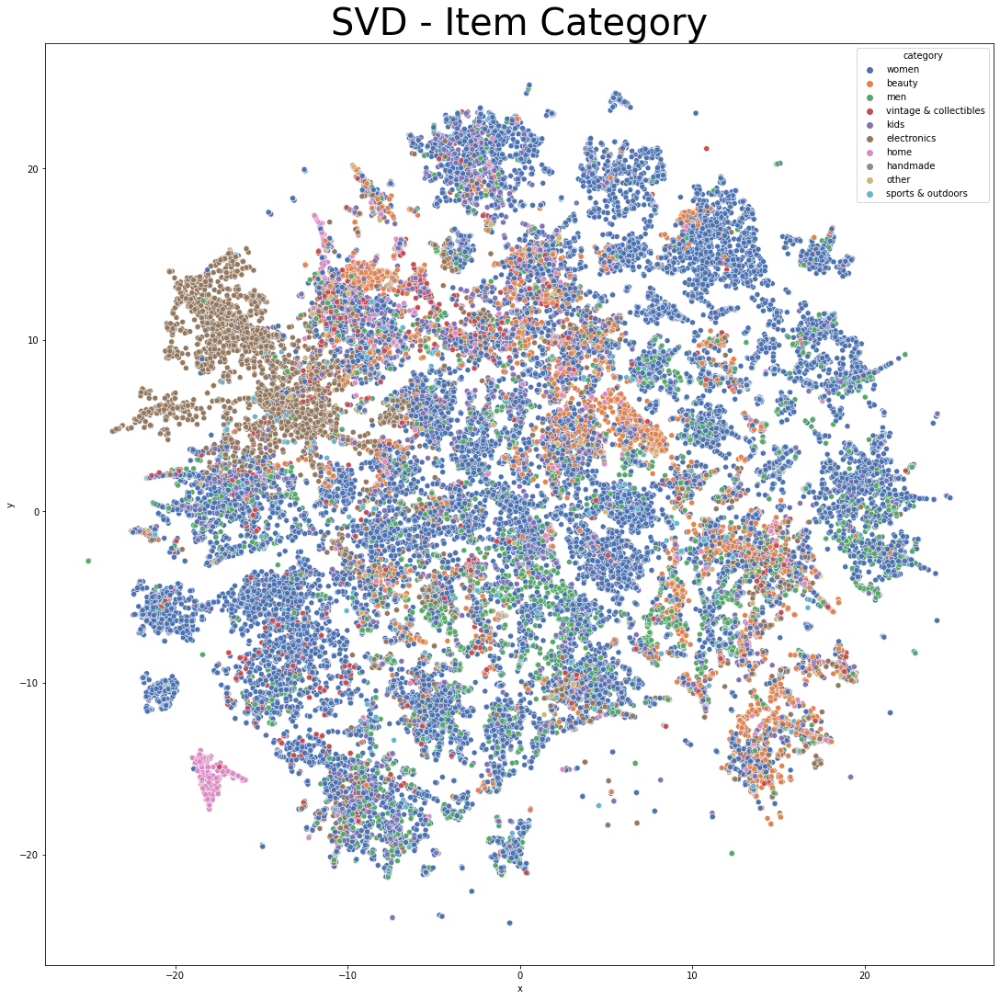

In [31]:
sns.scatterplot(data=svd_df, x='x', y='y', hue='category', palette="deep")
plt.title("SVD - Item Category",fontdict = {'fontsize' : 40})

## LDA

In [32]:
lda_model = LatentDirichletAllocation(n_components=50,
                                      learning_method='online',
                                      max_iter=20,
                                      random_state=42)
X_topics = lda_model.fit_transform(cvz)
X_topics.shape

(50000, 50)

In [33]:
n_top_words = 5
topic_summaries = []

topic_word = lda_model.components_  # get the topic words

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(description_feature_name)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' | '.join(topic_words)))

Topic 0: home | free | smoke | free home | leather
Topic 1: know | closet | let | ships | care
Topic 2: fit | size | like | fits | negotiate
Topic 3: worn | times | twice | couple | worn times
Topic 4: used | wear | minor | used condition | little
Topic 5: looking | thanks | ring | thanks looking | exclusive
Topic 6: bought | sealed | would | removed | new sealed
Topic 7: description | yet | description yet | pool | shirts
Topic 8: white | shirt | long | black | side
Topic 9: first | metal | cm | camps | number
Topic 10: card | wallet | style | come | seen
Topic 11: back | front | without | blue | navy
Topic 12: included | everything | silver | great | fast
Topic 13: am | authentic | 100 | original | box
Topic 14: 21 | forever | urban | brandy | people
Topic 15: phone | is | screen | bar | apple
Topic 16: bundle | blue | flaws | save | bundle save
Topic 17: secret | victories | victories secret | set | oz
Topic 18: stains | lips | lip | holes | tears
Topic 19: bag | condition | dust | 

In [34]:
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=500)

In [35]:
# reduce dimension to 2 using tsne
tsne_lda = tsne_model.fit_transform(X_topics)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.169s...
[t-SNE] Computed neighbors for 50000 samples in 244.720s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for s

In [36]:
unnormalized = np.matrix(X_topics)
doc_topic = unnormalized/unnormalized.sum(axis=1)

lda_keys = []
for i, tweet in enumerate(df['clean_item_description']):
    lda_keys += [doc_topic[i].argmax()]

lda_df = pd.DataFrame(tsne_lda, columns=['x','y'])
lda_df['description'] = df['clean_item_description']
lda_df['price_bin'] = df['price_bin']
lda_df['category'] = df['c1']
lda_df['topic'] = lda_keys
lda_df['topic'] = lda_df['topic'].map(int)

Text(0.5, 1.0, 'Latent Dirichlet Allocation - Price Bin')

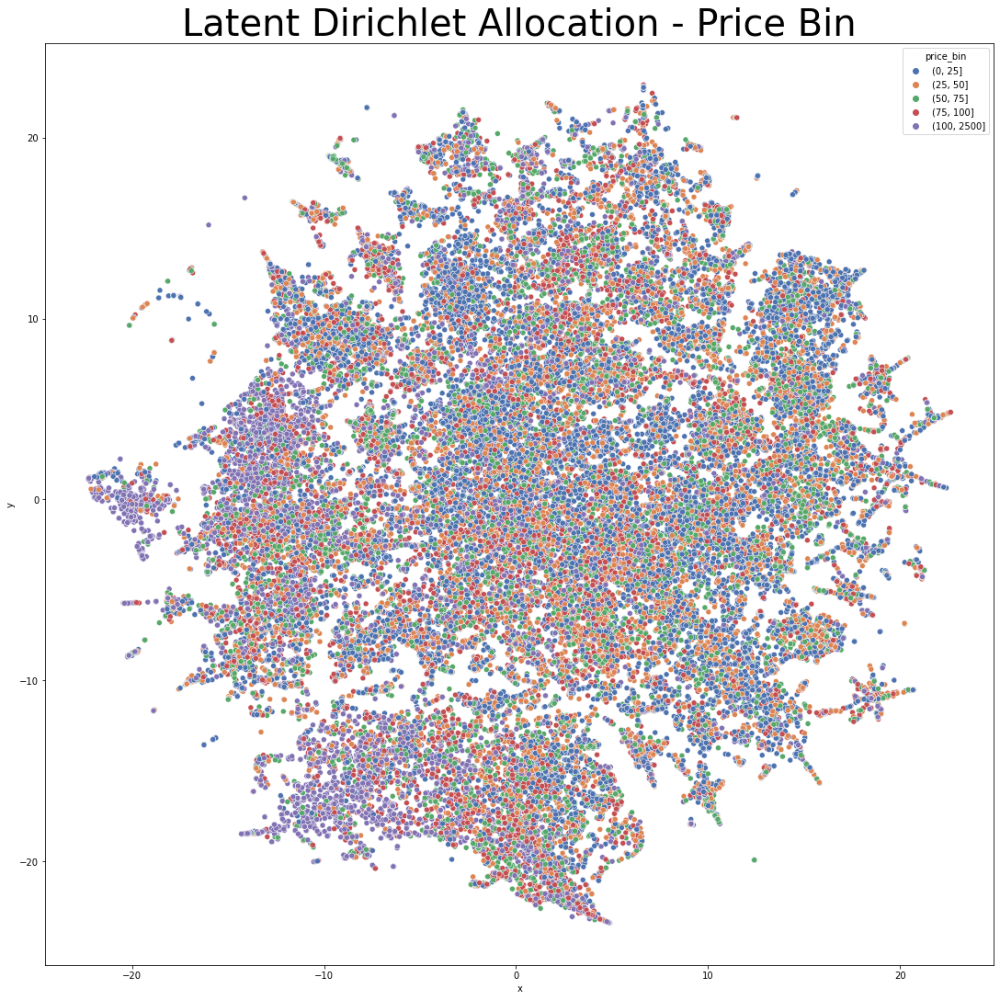

In [37]:
sns.scatterplot(data=lda_df, x='x', y='y', hue='price_bin', palette="deep")
plt.title("Latent Dirichlet Allocation - Price Bin",fontdict = {'fontsize' : 40})

Text(0.5, 1.0, 'Latent Dirichlet Allocation - Topic')

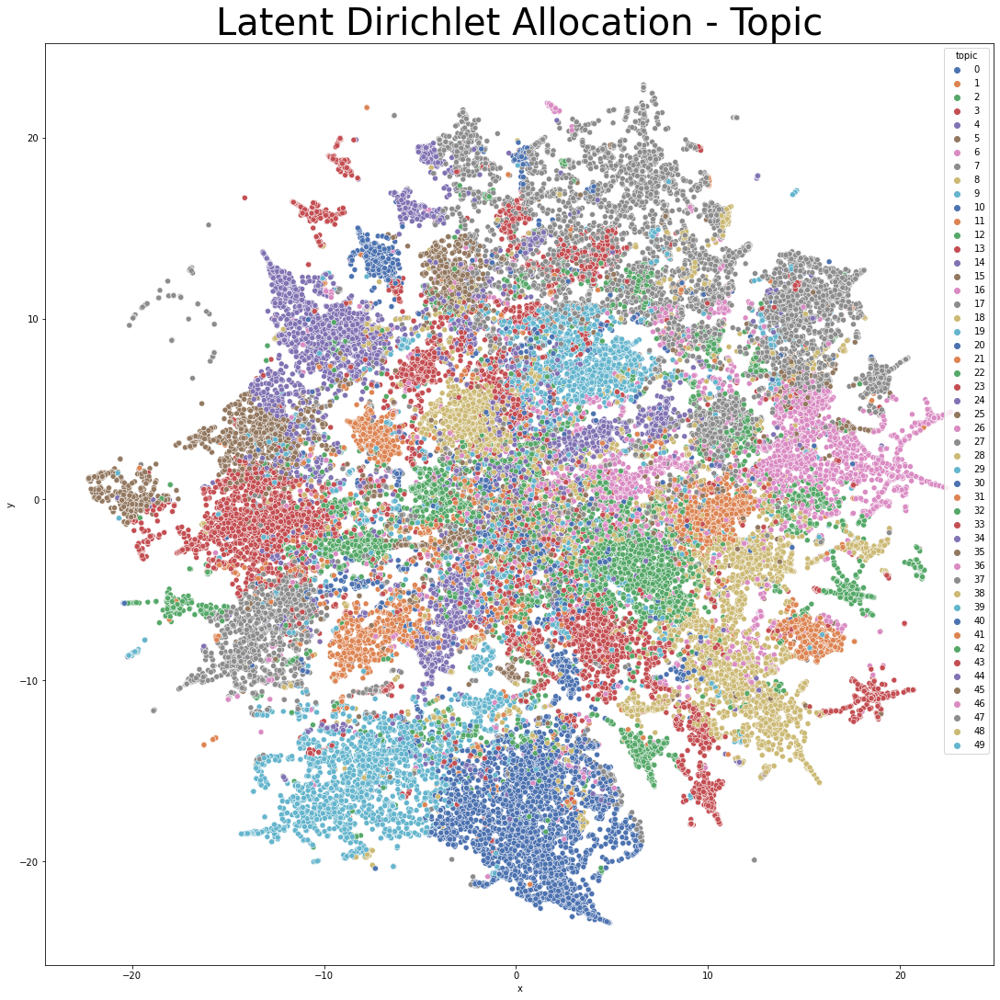

In [38]:
sns.scatterplot(data=lda_df, x='x', y='y', hue='topic', palette="deep")
plt.title("Latent Dirichlet Allocation - Topic",fontdict = {'fontsize' : 40})